# JFK International Airport Weather Prediction using Prophet

In [1]:
# Library import
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np

In [2]:
# Loading data
weather = pd.read_csv("jfk_weather.csv", index_col="DATE")

The five core weather values are:

PRCP = Precipitation (mm or inches )
SNOW = Snowfall (mm or inches )
SNWD = Snow depth (mm or inches )
TMAX = Maximum temperature (Fahrenheit or Celsius as per user preference)
TMIN = Minimum temperature (Fahrenheit or Celsius as per user preference)

In [3]:
# View DataFrame
weather

,STATION,NAME,ACMH,ACSH,AWND,FMTM,PGTM,PRCP,SNOW,SNWD,...,WT11,WT13,WT14,WT15,WT16,WT17,WT18,WT21,WT22,WV01
DATE,,,,,,,,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",80.0,90.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",30.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",80.0,100.0,NaN,NaN,NaN,0.02,0.0,0.0,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",10.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",30.0,10.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,12.97,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,11.18,NaN,NaN,0.43,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-16,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,17.22,NaN,NaN,0.20,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Info about weather
weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19315 entries, 1970-01-01 to 2022-11-18
Data columns (total 44 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   STATION  19315 non-null  object 
 1   NAME     19315 non-null  object 
 2   ACMH     9615 non-null   float64
 3   ACSH     9616 non-null   float64
 4   AWND     14200 non-null  float64
 5   FMTM     10124 non-null  float64
 6   PGTM     12269 non-null  float64
 7   PRCP     19315 non-null  float64
 8   SNOW     19315 non-null  float64
 9   SNWD     19314 non-null  float64
 10  TAVG     6192 non-null   float64
 11  TMAX     19315 non-null  int64  
 12  TMIN     19315 non-null  int64  
 13  TSUN     31 non-null     float64
 14  WDF1     9611 non-null   float64
 15  WDF2     9698 non-null   float64
 16  WDF5     9615 non-null   float64
 17  WDFG     5121 non-null   float64
 18  WDFM     1 non-null      float64
 19  WESD     6071 non-null   float64
 20  WSF1     9614 non-null   float64
 21  WSF

In [5]:
# Clean invalid columns
null_pct = weather.apply(pd.isnull).sum()/weather.shape[0]
null_pct

STATION    0.000000
NAME       0.000000
ACMH       0.502200
ACSH       0.502149
AWND       0.264820
FMTM       0.475848
PGTM       0.364794
PRCP       0.000000
SNOW       0.000000
SNWD       0.000052
TAVG       0.679420
TMAX       0.000000
TMIN       0.000000
TSUN       0.998395
WDF1       0.502407
WDF2       0.497903
WDF5       0.502200
WDFG       0.734869
WDFM       0.999948
WESD       0.685685
WSF1       0.502252
WSF2       0.497903
WSF5       0.502252
WSFG       0.613616
WSFM       0.999948
WT01       0.630132
WT02       0.934973
WT03       0.933368
WT04       0.982604
WT05       0.981155
WT06       0.990629
WT07       0.994408
WT08       0.797152
WT09       0.992752
WT11       0.999275
WT13       0.886875
WT14       0.954077
WT15       0.997826
WT16       0.659487
WT17       0.996894
WT18       0.939581
WT21       0.999741
WT22       0.997463
WV01       0.999948
dtype: float64

In [6]:
# Choosing features
valid_columns = weather.columns[null_pct < .05]
valid_columns

Index(['STATION', 'NAME', 'PRCP', 'SNOW', 'SNWD', 'TMAX', 'TMIN'], dtype='object')

In [7]:
# Distinct categories of 'NAME' column
weather.STATION.unique(), weather['NAME'].unique()

(array(['USW00094789'], dtype=object),
 array(['JFK INTERNATIONAL AIRPORT, NY US'], dtype=object))

In [8]:
# Choosing columns to use
core_weather = weather[['PRCP', 'SNOW', 'SNWD', 'TMIN','TMAX']].copy()
# Changing column names 
core_weather.columns = ['precipitation', 'snow', 'snow_depth', 'min_temp', 'max_temp']

In [9]:
core_weather.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19315 entries, 1970-01-01 to 2022-11-18
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   precipitation  19315 non-null  float64
 1   snow           19315 non-null  float64
 2   snow_depth     19314 non-null  float64
 3   min_temp       19315 non-null  int64  
 4   max_temp       19315 non-null  int64  
dtypes: float64(3), int64(2)
memory usage: 905.4+ KB


In [10]:
# Data type of the index 
core_weather.index.dtype

dtype('O')

In [11]:
# Changing data type to datetime
core_weather.index = pd.to_datetime(weather.index)

In [12]:
core_weather.index.dtype

dtype('<M8[ns]')

In [13]:
# Look at first 5 rows
core_weather.head()

,precipitation,snow,snow_depth,min_temp,max_temp
DATE,,,,,
1970-01-01,0.00,0.0,0.0,22,28
1970-01-02,0.00,0.0,0.0,22,31
1970-01-03,0.02,0.0,0.0,25,38
1970-01-04,0.00,0.0,0.0,23,31
1970-01-05,0.00,0.0,0.0,21,35


In [14]:
# Check for missing value defined in data documentation
core_weather.apply(lambda x: (x == 9999).sum())

precipitation    0
snow             0
snow_depth       0
min_temp         0
max_temp         0
dtype: int64

In [15]:
# Check for missing values
core_weather.apply(pd.isnull).sum()

precipitation    0
snow             0
snow_depth       1
min_temp         0
max_temp         0
dtype: int64

In [16]:
# Values counts of 'snow_depth'
core_weather["snow_depth"].value_counts()

0.0     18342
1.0       223
2.0       189
3.0        98
4.0        61
1.2        50
6.0        46
5.0        44
7.0        27
8.0        26
5.1        21
9.0        18
3.1        17
7.1        17
11.0       15
10.0       13
3.9        13
5.9        13
7.9        12
9.1        11
12.0       11
14.0        9
9.8         8
13.0        5
17.0        4
19.0        3
16.0        3
22.0        3
15.0        2
26.0        2
28.0        2
18.0        2
21.0        2
23.0        1
11.8        1
Name: snow_depth, dtype: int64

In [17]:
# Median of 'snow_depth'
core_weather['snow_depth'].median()

0.0

In [18]:
# Mean of 'snow_depth'
core_weather['snow_depth'].mean()

0.20933001967484727

In [19]:
# Filling in missing values
core_weather['snow_depth'] = core_weather['snow_depth'].fillna(0.0)

In [20]:
# Re check missing values
core_weather.apply(pd.isnull).sum()

precipitation    0
snow             0
snow_depth       0
min_temp         0
max_temp         0
dtype: int64

In [21]:
core_weather.head()

,precipitation,snow,snow_depth,min_temp,max_temp
DATE,,,,,
1970-01-01,0.00,0.0,0.0,22,28
1970-01-02,0.00,0.0,0.0,22,31
1970-01-03,0.02,0.0,0.0,25,38
1970-01-04,0.00,0.0,0.0,23,31
1970-01-05,0.00,0.0,0.0,21,35


In [22]:
# Setup time series for prophet
core_weather['y'] = core_weather.shift(-1)['max_temp']

In [23]:
# Forward filling in 
core_weather = core_weather.ffill()

In [24]:
core_weather["ds"] = core_weather.index

In [25]:
core_weather.shape

(19315, 7)

In [26]:
# Define predicting features
predictors = core_weather.columns[~core_weather.columns.isin(["y", "precipitation", "snow", "snow_depth", "min_temp", "ds"])]

In [27]:
core_weather

,precipitation,snow,snow_depth,min_temp,max_temp,y,ds
DATE,,,,,,,
1970-01-01,0.00,0.0,0.0,22,28,31.0,1970-01-01
1970-01-02,0.00,0.0,0.0,22,31,38.0,1970-01-02
1970-01-03,0.02,0.0,0.0,25,38,31.0,1970-01-03
1970-01-04,0.00,0.0,0.0,23,31,35.0,1970-01-04
1970-01-05,0.00,0.0,0.0,21,35,36.0,1970-01-05
...,...,...,...,...,...,...,...
2022-11-14,0.00,0.0,0.0,35,47,46.0,2022-11-14
2022-11-15,0.43,0.0,0.0,33,46,53.0,2022-11-15
2022-11-16,0.20,0.0,0.0,41,53,47.0,2022-11-16


In [28]:
# Splitting into train and test
train = core_weather[:"2021-12-31"]
test = core_weather["2021-12-31":]

In [29]:
# Fit initial prophet model
from prophet import Prophet

def fit_prophet(train):
    m = Prophet()
    for p in predictors:
        m.add_regressor(p)
    m.fit(train)
    return m

m = fit_prophet(train)

14:59:31 - cmdstanpy - INFO - Chain [1] start processing
15:00:03 - cmdstanpy - INFO - Chain [1] done processing


In [30]:
# Make predictions
predictions = m.predict(test)

In [31]:
predictions

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-12-31,62.372073,39.852048,55.700393,62.372073,62.372073,-14.858824,-14.858824,-14.858824,-5.370833,...,-0.002202,-0.002202,-0.002202,-9.485790,-9.485790,-9.485790,0.0,0.0,0.0,47.513249
1,2022-01-01,62.372129,39.922782,55.962413,62.372129,62.372129,-14.470782,-14.470782,-14.470782,-4.820466,...,-0.085604,-0.085604,-0.085604,-9.564711,-9.564711,-9.564711,0.0,0.0,0.0,47.901347
2,2022-01-02,62.372184,43.311876,59.558708,62.372184,62.372184,-11.108334,-11.108334,-11.108334,-1.518267,...,0.052033,0.052033,0.052033,-9.642100,-9.642100,-9.642100,0.0,0.0,0.0,51.263850
3,2022-01-03,62.372240,32.587321,49.082129,62.372240,62.372240,-21.938245,-21.938245,-21.938245,-12.525597,...,0.305164,0.305164,0.305164,-9.717812,-9.717812,-9.717812,0.0,0.0,0.0,40.433995
4,2022-01-04,62.372296,28.623592,44.512582,62.372296,62.372296,-25.685115,-25.685115,-25.685115,-15.827796,...,-0.065642,-0.065642,-0.065642,-9.791677,-9.791677,-9.791677,0.0,0.0,0.0,36.687181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318,2022-11-14,62.389808,42.809506,59.076121,62.384517,62.396045,-11.402532,-11.402532,-11.402532,-8.122665,...,0.305164,0.305164,0.305164,-3.585031,-3.585031,-3.585031,0.0,0.0,0.0,50.987276
319,2022-11-15,62.389864,41.878208,57.724536,62.384497,62.396176,-12.484569,-12.484569,-12.484569,-8.673032,...,-0.065642,-0.065642,-0.065642,-3.745896,-3.745896,-3.745896,0.0,0.0,0.0,49.905295
320,2022-11-16,62.389920,45.437774,61.624614,62.384477,62.396307,-8.938570,-8.938570,-8.938570,-4.820466,...,-0.211717,-0.211717,-0.211717,-3.906387,-3.906387,-3.906387,0.0,0.0,0.0,53.451350
321,2022-11-17,62.389976,42.618795,58.418187,62.384458,62.396406,-12.181175,-12.181175,-12.181175,-8.122665,...,0.007968,0.007968,0.007968,-4.066477,-4.066477,-4.066477,0.0,0.0,0.0,50.208801


In [32]:
# Show plot 

from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric

plot_components_plotly(m, predictions)

In [33]:
# Show coeffients

from prophet.utilities import regressor_coefficients

regressor_coefficients(m)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,max_temp,additive,61.758648,0.550366,0.550366,0.550366


In [34]:
# Define predictions for test
predictions.index = test.index
predictions["actual"] = test["y"]

In [35]:
# Evaluate model using mean squared error
def mse(predictions, actual_label="actual", pred_label="yhat"):
    se = ((predictions[actual_label] - predictions[pred_label]) ** 2)
    print(se.mean())
    
mse(predictions)

44.59952168961901


In [36]:
# Cross validate across data set
from prophet.diagnostics import cross_validation, performance_metrics

m = fit_prophet(core_weather)
cv = cross_validation(m, initial=f'{365 * 5} days', period='180 days', horizon = '180 days', parallel="processes")

15:00:41 - cmdstanpy - INFO - Chain [1] start processing
15:01:10 - cmdstanpy - INFO - Chain [1] done processing


In [37]:
mse(cv, actual_label="y")

40.12439483850038


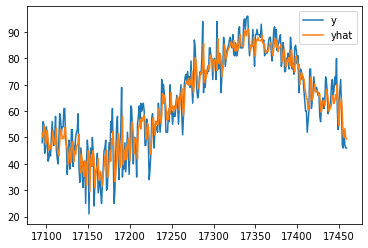

In [38]:
cv[["y", "yhat"]][-365:].plot();

In [39]:
# Predict one day ahead with high accuracy
m = fit_prophet(core_weather)
m.predict(core_weather.iloc[-1:])

15:41:45 - cmdstanpy - INFO - Chain [1] start processing
15:42:19 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-11-18,62.451298,41.763267,58.181184,62.451298,62.451298,-12.949946,-12.949946,-12.949946,-8.676128,...,-0.018965,-0.018965,-0.018965,-4.254853,-4.254853,-4.254853,0.0,0.0,0.0,49.501351


In [40]:
# Predict multiple days ahead with lower accuracy
m = Prophet()
m.fit(core_weather)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

15:42:28 - cmdstanpy - INFO - Chain [1] start processing
15:42:49 - cmdstanpy - INFO - Chain [1] done processing


In [41]:
# Show the forecast
from prophet.plot import plot_plotly

plot_plotly(m, forecast)